# Predicting Total Cholesterol from NHANES Biomarkers and Demographic Features

This report demonstrates how the NHANES Health Regression pipeline was applied to estimate **total cholesterol** using dietary, lifestyle, lab, and demographic features from the 2015–2016 cycle. 

I explore predictive performance, model comparison, and key drivers of total cholesterol based on multiple machine learning models.

This analysis finds XGBoost and Gradient Boosting models have the greatest predictive accuracy and  with R² scores ~0.44, corresponding to an improvement of approximately **33%** over the Linear baseline model.

All visualizations are saved to the `figures/` directory.


In [3]:
import pandas as pd
import numpy as np
from IPython.display import Image
import matplotlib.pyplot as plt
import seaborn as sns

## 1. Dataset Overview

We use NHANES 2015–2016 data with `total_cholesterol` as the target. After cleaning, the dataset contains 6865 samples and 23 features. Features include anthropometric measurements, blood pressure, lab values, and survey-based variables.

Target summary:

- `total_cholesterol` (mg/dL)
- Log transform: Yes
- Drop extrema: Yes (5th–95th percentile applied to select features)


In [5]:
df = pd.read_csv("files/data_report/processed/clean_data.csv")
df.describe()[["total_cholesterol"]]

,total_cholesterol
count,6549.000000
mean,178.369217
std,31.690675
min,122.000000
25%,153.000000
50%,176.000000
75%,201.000000
max,254.000000


## 2. Exploratory Data Analysis

This section explores the distribution of the target variable (`total_cholesterol`) and examines relationships with both categorical and numerical input features.

### A) Target Distribution
The distribution of the target variable, `total_cholesterol` (mg/dL), is moderately right-skewed.  
A **log transformation** is applied during preprocessing to reduce skewness, stabilize variance, and improve model performance.  
This transformation is reversed during prediction to retain interpretability in original units.

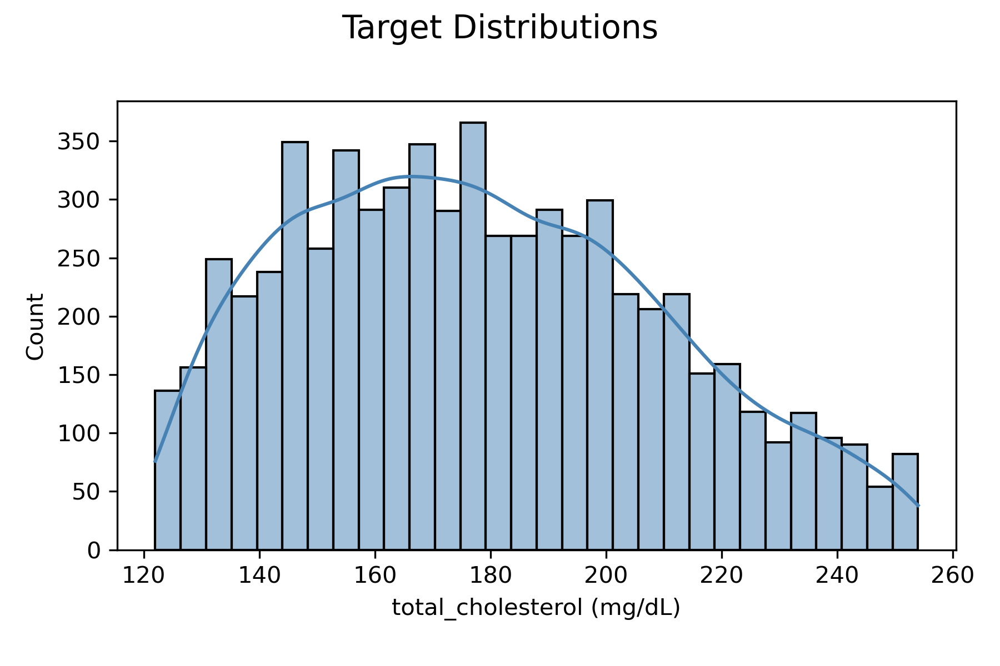

In [7]:
Image("files/figures_report/eda/hist_targets.png")

### B) Feature Distributions (All Features)
Histograms are provided for all features.  
- Numerical features include KDE curves to assess shape, spread, and skew.  
- Categorical features are shown as box plots, with labeled value mappings to clarify encoding (below).
- Values outside of the 5th and 95th percentiles are removed from all numerical features.

In [9]:
Image("files/figures_report/eda/hist_all_features.png")

The categorical features are encodes as such:

- **sex**:  
  1.0 = Male  
  2.0 = Female

- **race_ethnicity**:  
  1.0 = Mexican American  
  2.0 = Other Hispanic  
  3.0 = Non-Hispanic White  
  4.0 = Non-Hispanic Black  
  5.0 = Other Race (including Multi-Racial)  

- **ever_smoked_100**:  
  1.0 = Yes  
  2.0 = No

- **monthly_family_income ($)**:  
  1.0 = 0 – 399  
  2.0 = 400 – 799  
  3.0 = 800 – 1,249  
  4.0 = 1,250 – 1,649  
  5.0 = 1,650 – 2,099  
  6.0 = 2,100 – 2,899  
  7.0 = 2,900 – 3,749  
  8.0 = 3,750 – 4,599  
  9.0 = 4,600 – 5,399  
  10.0 = 5,400 – 6,249  
  11.0 = 6,250 – 8,399  
  12.0 = 8,400 and over

- **has_health_insurance**:  
  1.0 = Yes  
  2.0 = No


### C) Target vs. Categorical Features (Boxplots)  
Boxplots visualize the distribution of `total_cholesterol` across categories for each categorical feature.  
This highlights group-level differences in the target (e.g., sex, race, smoking status).


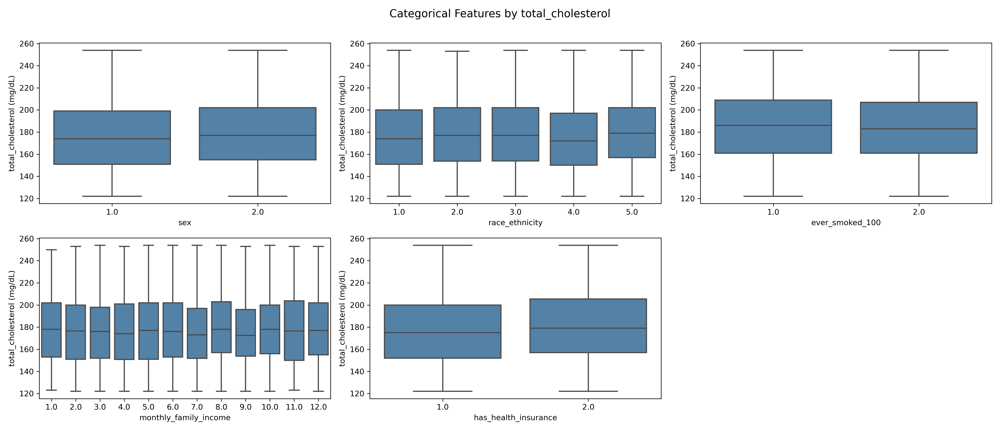

In [12]:
Image("files/figures_report/eda/boxplot_total_cholesterol.png")

### D) Target vs. Numerical Features (Univariate Regressions)
Each numerical feature is independently regressed against the target to estimate marginal predictive power.  
R² values are shown for each relationship, helping to identify strong individual predictors. Red trendlines are shown with a 95% confidence interval estimate (light red envelope).

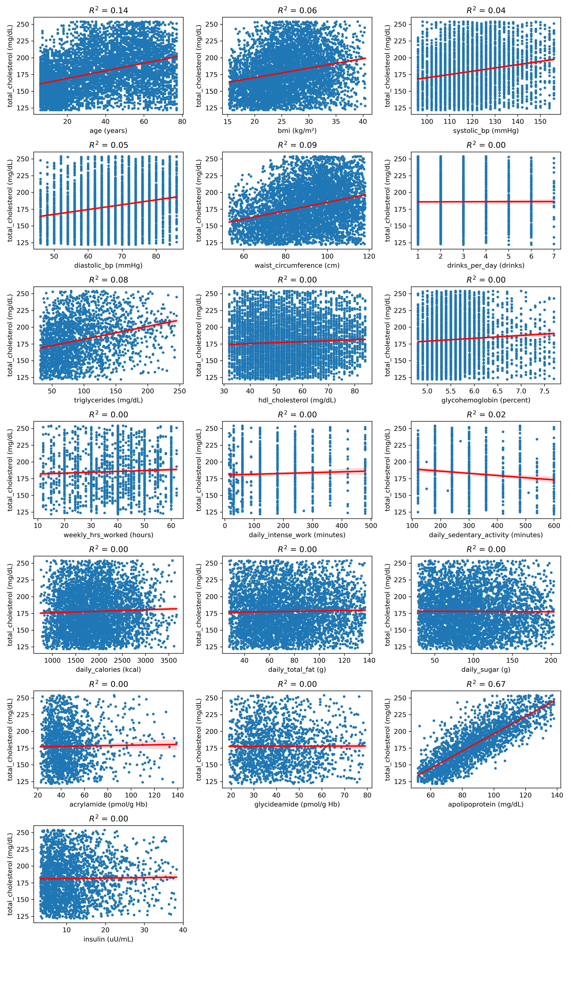

In [14]:
Image("files/figures_report/eda/univariate_total_cholesterol.png")

### E) Numeric Feature Correlations (Heatmap) 
A Pearson correlation heatmap shows linear correlations between numeric features and the target.  
This helps assess redundancy among predictors and can inform feature selection or regularization strategies.

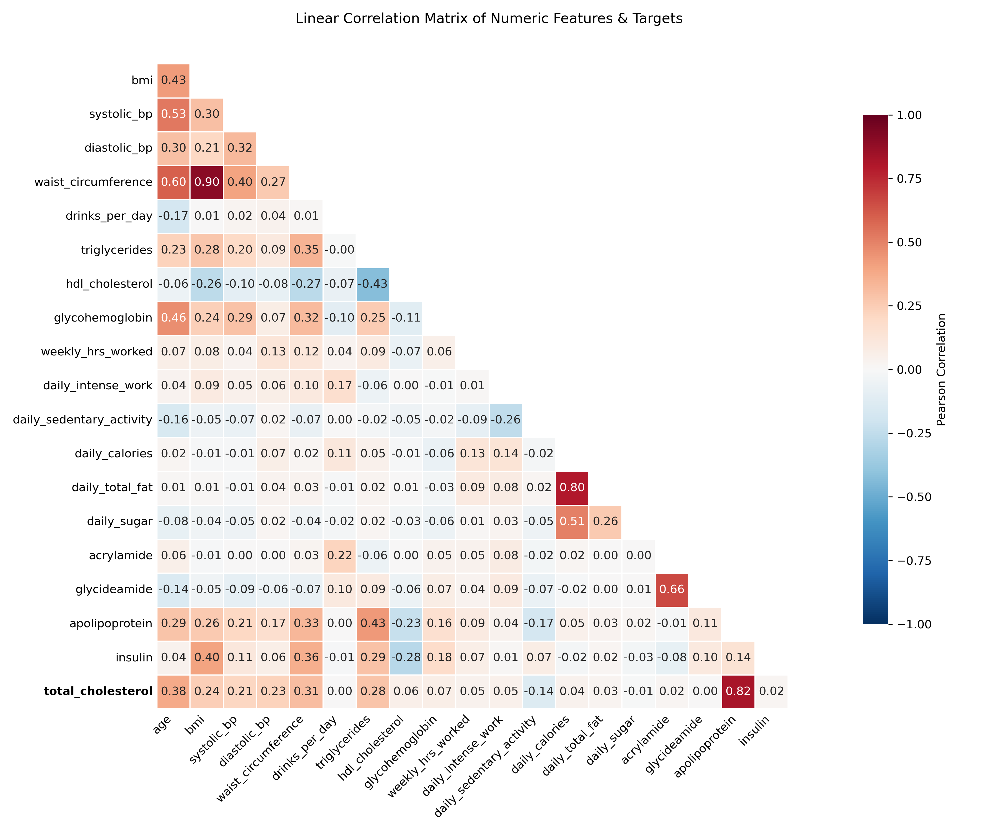

In [16]:
Image("files/figures_report/eda/correlation_heatmap.png")

The figure above shows every combination of features (and targets) and their Pearson Correlation. The target `total_cholesterol` is bolded and corresponds to an expected strong positive correlation with apolipoprotein measurements and moderate positive correlations with `age`, `bmi`, `systolic_bp`, `diasolic_bp`, `waist_circumference`, and `triglycerides` features.

## 3. **Model Training and Selection**

This section documents the model development process for predicting `total_cholesterol`, including model types, tuning strategy, and training diagnostics. Training was performed on a fixed subset consisting of 80% of the dataset with 10-fold cross-validation.  

### A) Models Trained

The pipeline supports a range of supervised regressors. For this task, the following models were included:

- **Linear Regression** (baseline)
- **Random Forest Regressor**
- **Gradient Boosting Regressor**
- **XGBoost Regressor**
- **Support Vector Regressor (SVR)**
- **K-Nearest Neighbors Regressor (KNN)**

Each model was wrapped in a `MultiOutputRegressor` to support multi-target prediction, although only `total_cholesterol` was modeled in this case.

### B) Hyperparameter Tuning

Hyperparameters were optimized using **Optuna**, a Bayesian optimization framework. The search was constrained by a maximum of 1,000 trials, or a timeout of 3 hours, whichever came first. Each trial used 10-fold cross validation on the training set to estimate performance.

The objective function maximized the **mean cross-validated R²**, ensuring models were selected based on generalization ability rather than overfitting training data.

#### B1. Optimization History 

The figure below shows an example Optuna optimization history for one model (XGBoost). Each point represents the R² score from a single trial using 10-fold cross-validation on the training set, with different hyperparameter combinations.

The red line tracks the best score achieved so far. Most improvements occur early in the search, but the plot shows continued exploration of the parameter space across all 1,000 trials.

This visualization helps confirm that the search space was well-explored and that convergence wasn't premature. Similar tuning procedures were applied across all models.


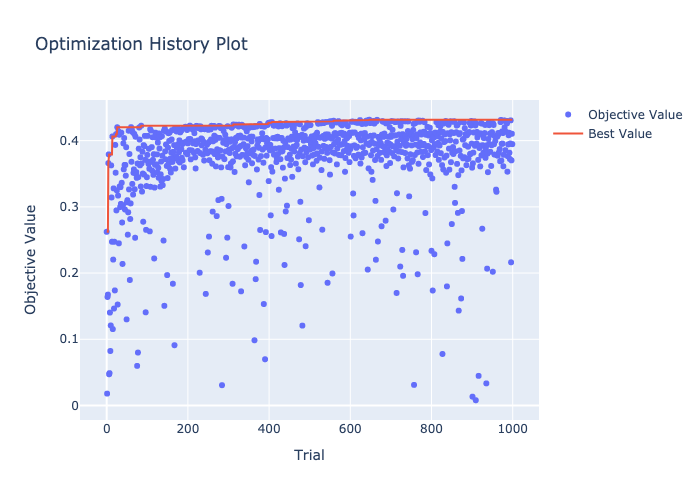

In [20]:
Image("files/figures_report/evaluation/optuna_visuals/xgboost_opt_history.png")

#### B2. Hyperparameter Importance  

The parallel coordinate plot below visualizes hyperparameter interactions across all 1,000 XGBoost tuning trials. Each line represents a single trial, with its path passing through the value used for each hyperparameter. Lines are colored by performance (R²), with darker shades indicating better results.

This plot helps identify patterns among top-performing trials. For example, higher-performing configurations often cluster around intermediate values of `learning_rate`, low `reg_alpha`, and moderate `max_depth`. In contrast, trials with extreme values in certain dimensions (e.g., `gamma`) show weaker performance.

Such visualizations are useful for diagnosing tuning behavior and understanding which hyperparameter combinations drive performance.

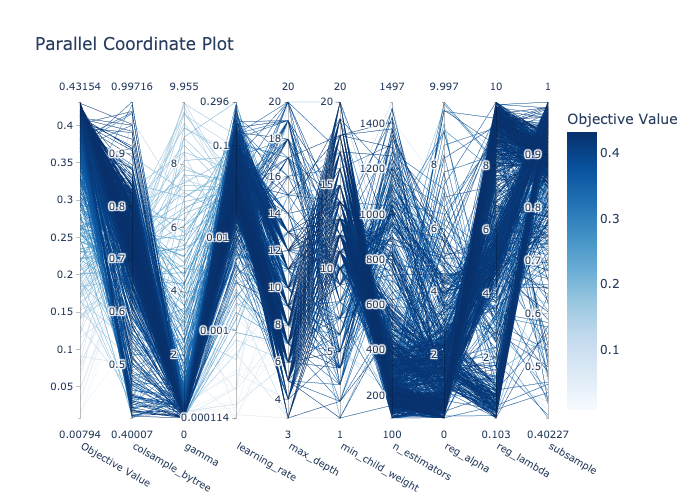

In [22]:
Image("files/figures_report/evaluation/optuna_visuals/xgboost_parallel_coord.png")

#### B3. Parallel Coordinate Plot

The bar chart below shows the relative importance of each hyperparameter in the XGBoost tuning process, as estimated by Optuna. Importance reflects how much each parameter influenced the objective value (cross-validated R²) across all trials.

In this case, `gamma` overwhelmingly dominated the tuning process, accounting for ~85% of the variance in model performance. Other parameters like `min_child_weight`, `reg_alpha`, and `subsample` had moderate influence, while parameters like `max_depth` and `colsample_bytree` had negligible effect within the tested range.

This analysis helps identify which hyperparameters were most impactful and may warrant more targeted tuning or constraint in future runs.


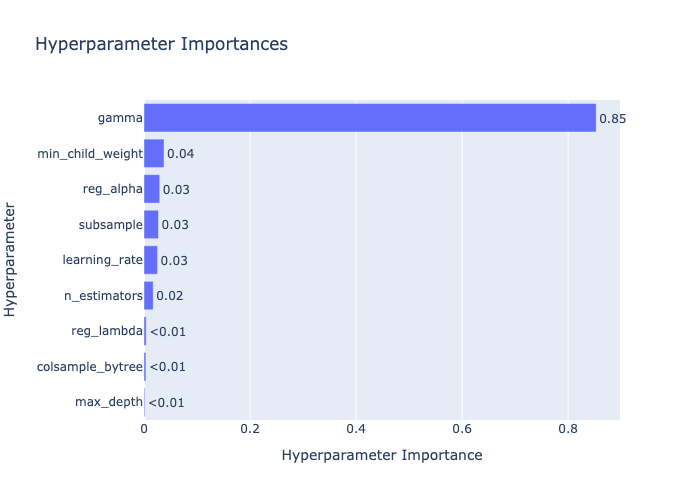

In [24]:
Image("files/figures_report/evaluation/optuna_visuals/xgboost_param_importance.png")

### C) Training Diagnostics

#### C1. CV Fold Sensitivity  

The figure below shows how model performance varies with different numbers of cross-validation folds during training. Each line represents the mean R² (left) and RMSE (right) across folds for a given model, averaged over multiple tuning runs.

As a note, the CV is not explicitly optimized, as it was held at 10 folds during training. This analysis  demonstrates that 10-fold cross-validation provides a good balance between stability and computational cost for this pipeline.

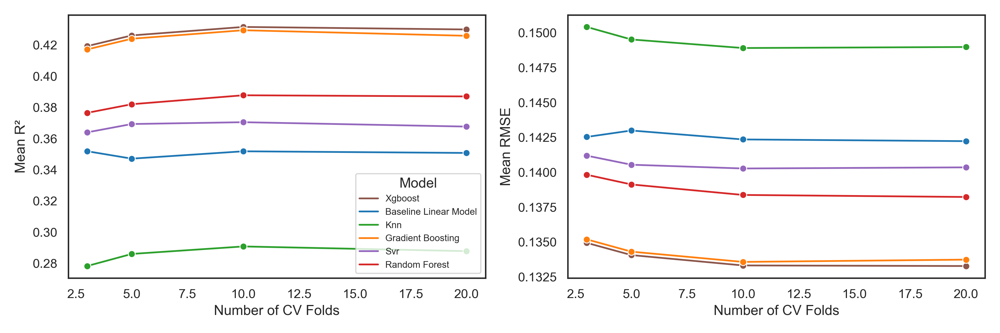

In [26]:
Image("files/figures_report/evaluation/cv_fold_analysis.png")

#### C2. Training Metrics

The bar charts and table below show each model’s performance on the training folds across 10-fold cross-validation.  

Flexible models like **KNN** and **Random Forest** achieve near-perfect R² and low RMSE, indicating strong ability to fit the training data. However, these high scores can also signal potential overfitting. In contrast, models like **Linear Regression**, **SVR**, and **XGBoost** show lower R² and higher RMSE, reflecting more constrained capacity and stronger regularization.

Together, these metrics highlight the trade-off between model complexity and generalization, reinforcing the need to evaluate on unseen test data.


In [28]:
df_summary = pd.read_csv("files/summaries_report/train_metrics.csv")
display(df_summary)

,Model,R2 - total_cholesterol,RMSE - total_cholesterol
0,Linear Regression,0.361091,25.410477
1,Random Forest,0.882320,10.905471
2,Gradient Boosting,0.552101,21.275675
3,KNN,1.000000,0.000012
4,SVR,0.406907,24.482440
5,XGBoost,0.535690,21.661942


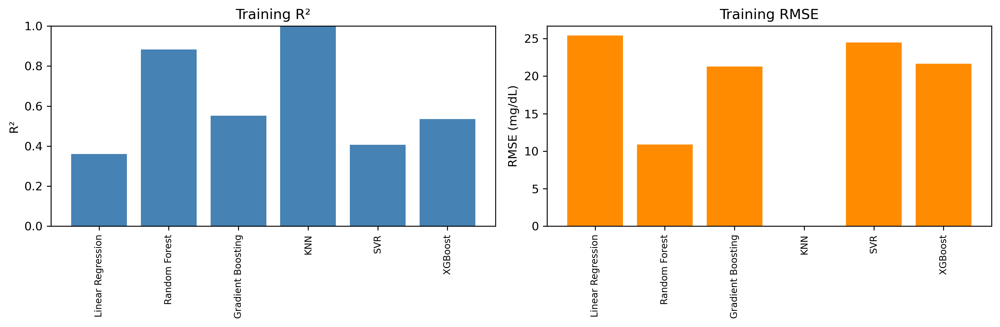

In [29]:
# Extract values
model_names = df_summary["Model"]
r2_values = df_summary["R2 - total_cholesterol"]
rmse_values = df_summary["RMSE - total_cholesterol"]

# Plot
fig, axes = plt.subplots(1, 2, figsize=(12, 4), dpi=300)

# R² subplot
axes[0].bar(model_names, r2_values, color='steelblue')
axes[0].set_title("Training R²")
axes[0].set_ylabel("R²")
axes[0].set_ylim(0, 1)

# RMSE subplot
axes[1].bar(model_names, rmse_values, color='darkorange')
axes[1].set_title("Training RMSE")
axes[1].set_ylabel("RMSE (mg/dL)")

# Shared formatting
for ax in axes:
    ax.tick_params(axis='x', labelrotation=90, labelsize=8)

plt.tight_layout()
plt.show()

#### C3. Training Residual Distributions (KDEs)

The figure below shows kernel density estimates (KDEs) of the training residuals for each model. Residuals are defined as the difference between the true and predicted `total_cholesterol` values.

A narrow, symmetric peak centered around zero reflects low training error and good fit. The **Random Forest** model shows the sharpest distribution, while **Linear Regression**, **SVR**, and **Gradient Boosting** have broader or slightly skewed curves, indicating higher variance in training error.

The **K-Nearest Neighbors (KNN)** model is not visible in the residual distribution plot because its training residuals are extremely close to zero. Although residuals were computed using cross-validation—where each fold predicts on data excluded from training—KNN still achieves near-perfect fit due to its non-parametric nature. For small values of `k`, KNN predictions are based on very similar training points, often yielding predicted values nearly identical to the true ones. This leads to minimal residuals even in cross-validated settings. However, this tight fit to training data can come at the cost of generalization, reinforcing the importance of test-set evaluation when assessing model performance.

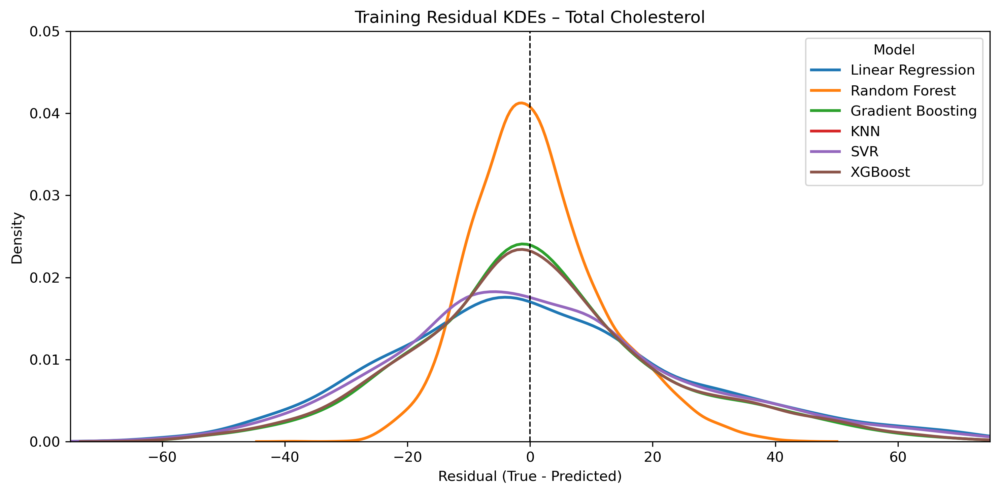

In [31]:
df_train_res = pd.read_csv("files/summaries_report/train_residuals.csv")

# === Settings ===
target_name = "total_cholesterol"
models_to_plot = df_train_res["Model"].unique()  # or manually specify

plt.figure(figsize=(10, 5), dpi=300)

# === KDE for each model's residuals ===
for model in models_to_plot:
    residuals = df_train_res.query("Model == @model and Target == @target_name")["Residual"]
    sns.kdeplot(residuals, label=model, linewidth=2)

# === Styling ===
plt.axvline(0, color="black", linestyle="--", linewidth=1)
plt.xlabel("Residual (True - Predicted)")
plt.ylabel("Density")
plt.title(f"Training Residual KDEs – {target_name.replace('_', ' ').title()}")
plt.ylim(0,0.05)
plt.xlim(-75, 75)
plt.legend(title="Model")
plt.tight_layout()
plt.show()


## 4. **Evaluation and Interpretation**

This section evaluates the performance of trained models on the held-out (20%) **2015–2016 test set**, with a focus on both quantitative metrics and qualitative diagnostic plots. All results presented here use the best hyperparameters selected during tuning.

### A) Comparison of Training and Test Performance Metrics

The table and figures below summarize **test R²** and **RMSE** for each model on the holdout dataset. These metrics reflect how well each model generalizes to unseen data.

The **XGBoost** model achieved the best performance, with an R² of **0.446** and RMSE of **23.3 mg/dL**, indicating both high explanatory power and low absolute error on test data.

In [34]:
# Load data
df_train = pd.read_csv("files/summaries_report/train_metrics.csv")
df_test = pd.read_csv("files/summaries_report/test_metrics.csv")

display(df_test)

,Model,R2 - total_cholesterol,RMSE - total_cholesterol
0,Linear Regression,0.355017,25.103420
1,Random Forest,0.390540,24.402337
2,Gradient Boosting,0.440457,23.381679
3,Knn,0.282627,26.474718
4,Svr,0.379054,24.631203
5,Xgboost,0.445960,23.266412


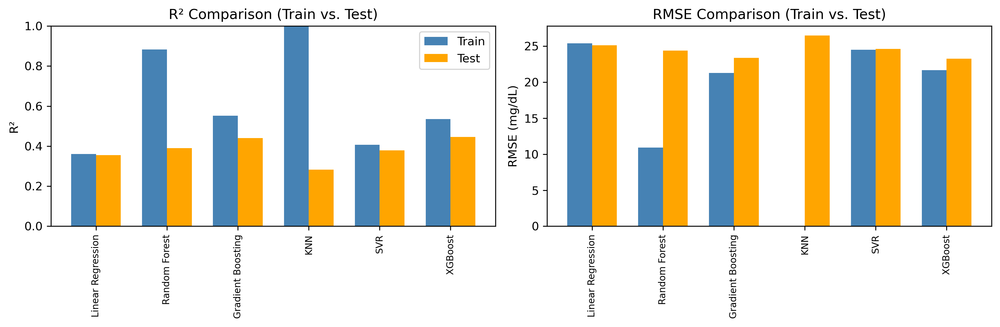

In [35]:
# Load data
df_train = pd.read_csv("files/summaries_report/train_metrics.csv")
df_test = pd.read_csv("files/summaries_report/test_metrics.csv")

# Define model names (assume same order for train and test)
models = df_train["Model"].values
x = np.arange(len(models))  # label locations
width = 0.35  # width of the bars

# Plot
fig, axes = plt.subplots(1, 2, figsize=(12, 4), dpi=300)

# R² subplot
axes[0].bar(x - width/2, df_train["R2 - total_cholesterol"], width, label="Train", color="steelblue")
axes[0].bar(x + width/2, df_test["R2 - total_cholesterol"], width, label="Test", color="orange")
axes[0].set_title("R² Comparison (Train vs. Test)")
axes[0].set_ylabel("R²")
axes[0].set_ylim(0, 1)
axes[0].set_xticks(x)
axes[0].set_xticklabels(models, rotation=90, fontsize=8)
axes[0].legend()

# RMSE subplot
axes[1].bar(x - width/2, df_train["RMSE - total_cholesterol"], width, label="Train", color="steelblue")
axes[1].bar(x + width/2, df_test["RMSE - total_cholesterol"], width, label="Test", color="orange")
axes[1].set_title("RMSE Comparison (Train vs. Test)")
axes[1].set_ylabel("RMSE (mg/dL)")
axes[1].set_xticks(x)
axes[1].set_xticklabels(models, rotation=90, fontsize=8)
# axes[1].legend()

plt.tight_layout()
plt.show()


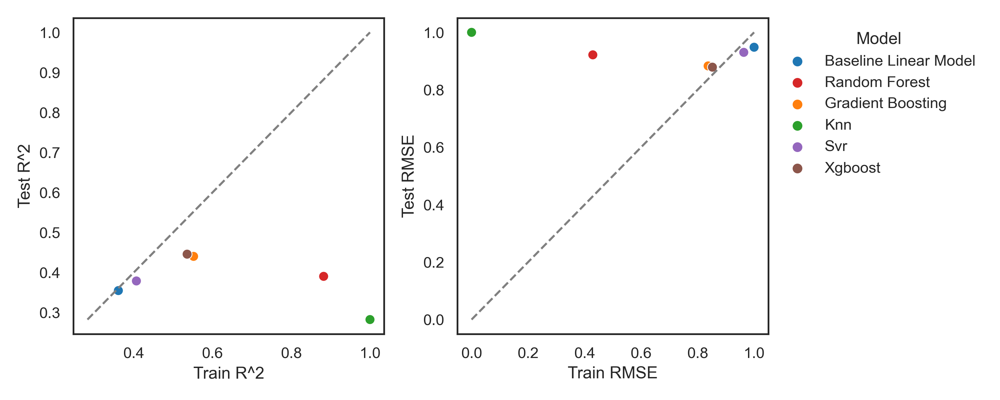

In [36]:
Image("files/figures_report/evaluation/train_test_metrics_comparison.png")

The scatter plots above compare training and test performance for each model:

- **Left**: Train vs. Test R² — higher values in both suggest better fit and generalization  
- **Right**: Train vs. Test RMSE — lower values indicate more accurate predictions (normalized such that 

**Note**: RMSE values are normalized per target to ensure fair comparison across models and targets. This is most useful when evaluating performance on **multiple targets**, but does not affect interpretation for a single-target task.

Each point represents a model’s performance, with the dashed gray line denoting ideal 1:1 agreement between training and test metrics.

Models that fall **significantly below the diagonal** in the left panel or **above it** in the right panel are likely overfitting: they perform well during training but degrade on unseen data. For instance, **KNN** and **Random Forest** show strong training scores but large gaps to test performance, suggesting limited generalization.

This comparison highlights the value of evaluating models on held-out data, not just cross-validation metrics.


### B) Comparison of Train and Test Residual Densities

To further evaluate model accuracy, we visualize **test residuals** — the difference between true and predicted values using models trained on the training split.

As with the training residuals, well-performing models should have **residuals centered around zero**, forming a tight and symmetric distribution. Wider spreads or skewness in the residuals may indicate bias or variance issues.

This visualization also helps assess **heteroscedasticity** — a condition where the variance of residuals changes across predicted values. Ideally, residuals should exhibit **homoscedasticity**, meaning constant variance across the range of predictions. Heteroscedasticity can signal model misspecification or suggest that certain data ranges are less well captured by the model.

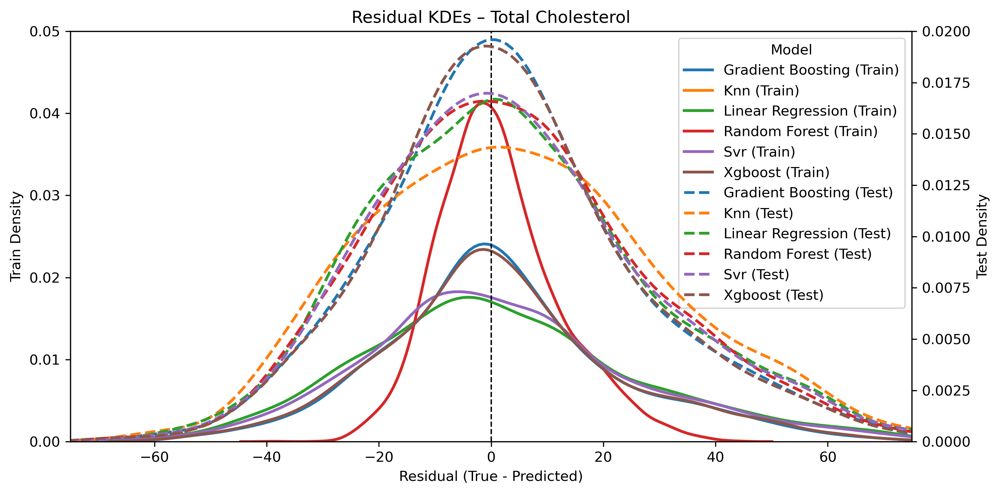

In [39]:
# Load data (update paths if needed)
df_train_res = pd.read_csv("files/summaries_report/train_residuals.csv")
df_test_res = pd.read_csv("files/summaries_report/test_residuals.csv")

# Clean model names
df_train_res["Model"] = df_train_res["Model"].str.title()
df_test_res["Model"] = df_test_res["Model"].str.title()

# Settings
target_name = "total_cholesterol"
models = sorted(df_train_res["Model"].unique())
palette = dict(zip(models, sns.color_palette(n_colors=len(models))))

# Plot
fig, ax1 = plt.subplots(figsize=(10, 5), dpi=300)
ax2 = ax1.twinx()  # Right y-axis

for model in models:
    # Extract residuals
    resid_train = df_train_res.query("Model == @model and Target == @target_name")["Residual"]
    resid_test = df_test_res.query("Model == @model and Target == @target_name")["Residual"]
    
    # KDE plots
    sns.kdeplot(resid_train, ax=ax1, color=palette[model], linestyle="-", linewidth=2, label=f"{model} (Train)")
    sns.kdeplot(resid_test, ax=ax2, color=palette[model], linestyle="--", linewidth=2, label=f"{model} (Test)")

# Styling
ax1.set_xlim(-75, 75)
ax1.set_ylim(0, 0.05)
ax2.set_ylim(0, 0.02)

ax1.set_xlabel("Residual (True - Predicted)")
ax1.set_ylabel("Train Density")
ax2.set_ylabel("Test Density")
ax1.axvline(0, color="black", linestyle="--", linewidth=1)
plt.title(f"Residual KDEs – {target_name.replace('_', ' ').title()}")

# Legend
lines_labels = [ax.get_legend_handles_labels() for ax in [ax1, ax2]]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
ax1.legend(lines, labels, title="Model", loc="upper right")

plt.tight_layout()
plt.show()


The figure above shows KDEs of residuals for each model, comparing **training (solid lines)** and **test (dashed lines)**. The y-axes are split: training densities are shown on the left, and test densities on the right.

A well-behaved model should have:
- Residuals **centered near zero**
- **Similar spread** between training and test sets
- Minimal signs of **heteroscedasticity** — that is, the variance of residuals should remain stable across predictions

Key observations:

- **Random Forest** fits the training data very tightly but exhibits a much broader spread on the test set, suggesting **overfitting**.
  
- **KNN** has near-zero training residuals (as expected from a memory-based model), but wider test residuals — another signal of overfitting.

- **XGBoost** and **Gradient Boosting** both show **tight, centered residuals** on the test set, with good alignment between training and test curves. Neither model displays significant skew or signs of heteroscedasticity.

Overall, **both XGBoost and Gradient Boosting appear to generalize well compared to the other models**, showing consistent residual distributions and the strongest relative predictive reliability.

### C) True vs. Predicted Scatterplots

Below are scatterplots of predicted vs. true values illustrate each model’s calibration and variance. Points clustering tightly around the diagonal line suggest accurate and unbiased predictions.

- **Random Forest** and **XGBoost** produce tight clouds around the identity line.
- **Linear Regression** shows more spread, especially at higher cholesterol values, indicating underfitting.


In [42]:
df_train.head()

,Model,R2 - total_cholesterol,RMSE - total_cholesterol
0,Linear Regression,0.361091,25.410477
1,Random Forest,0.882320,10.905471
2,Gradient Boosting,0.552101,21.275675
3,KNN,1.000000,0.000012
4,SVR,0.406907,24.482440


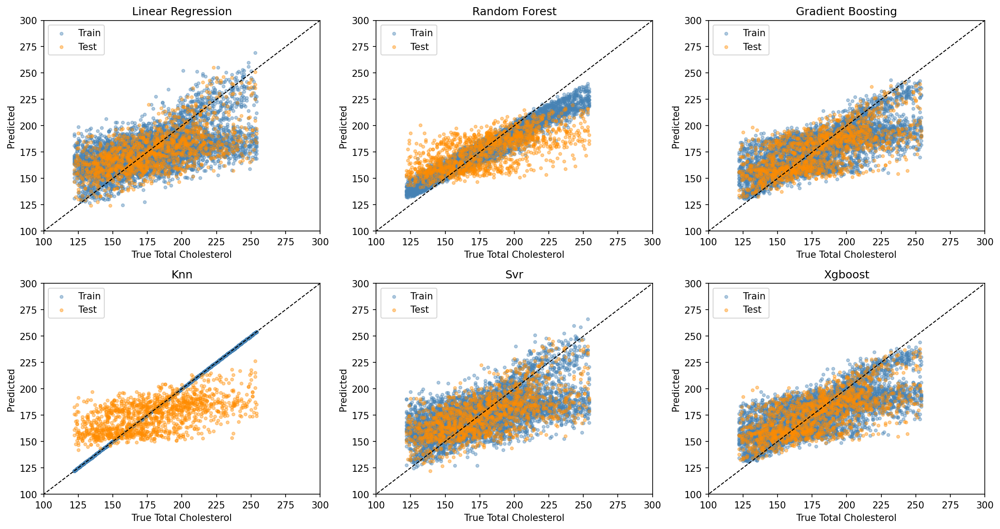

In [43]:
df_train = df_train_res
df_test = df_test_res

# Format model names consistently
df_train["Model"] = df_train["Model"].str.title()
df_test["Model"] = df_test["Model"].str.title()

# Compute predicted values
df_train["Predicted"] = df_train["True"] - df_train["Residual"]
df_test["Predicted"] = df_test["True"] - df_test["Residual"]

# Set up the plot
models = df_train["Model"].unique()
n_models = len(models)
n_cols = 3
n_rows = (n_models + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows), dpi=150)
axes = axes.flatten()

# Plot each model
for i, model in enumerate(models):
    ax = axes[i]
    train_data = df_train[df_train["Model"] == model]
    test_data = df_test[df_test["Model"] == model]

    ax.scatter(train_data["True"], train_data["Predicted"], label="Train", alpha=0.4, s=10, color="steelblue")
    ax.scatter(test_data["True"], test_data["Predicted"], label="Test", alpha=0.4, s=10, color="darkorange")
    ax.plot([0, 350], [0, 350], "k--", lw=1)

    ax.set_title(model)
    ax.set_xlabel("True Total Cholesterol")
    ax.set_ylabel("Predicted")

    ax.set_xlim(100, 300)
    ax.set_ylim(100, 300)
    ax.legend()

plt.tight_layout()
plt.show()

The figure above overlays **training** and **test** predictions for each model, comparing predicted `total_cholesterol` against true values. Each subplot includes a 1:1 reference line, where perfect predictions would lie.

- **Random Forest** aligns closely with the 1:1 line on the training set, but deviates more on the test set, indicating overfitting.
- **KNN** achieves nearly perfect training predictions (as expected), but fails to generalize, with substantial error on test data.
- **Linear Regression**, **Gradient Boosting**, **SVR**, and **XGBoost** show moderate spread from the diagonal, but maintain relatively consistent patterns across train and test sets.

Models with predictions that cluster tightly along the diagonal and show minimal differences between train and test sets are better at generalization. This plot highlights the trade-off between model flexibility, or capacity (e.g., Random Forest, KNN), and stability across training and testing splits (e.g., Linear Regression, SVR).

**Note on heteroskedasticity:**  
Across models, the spread of predictions remains relatively constant across the range of true cholesterol values, suggesting **homoskedasticity**—that is, residual variance appears uniform. There is no strong visual evidence of heteroskedasticity (e.g., a fanning pattern in the residuals), although subtle deviations could still exist and may warrant further statistical testing.

While both **XGBoost** and **Gradient Boosting** models capture the general trend of the data, they systematically **underpredict high cholesterol values** and **overpredict at the lower end** on both training and testing splits. This pattern suggests a form of **regression toward the mean**, where predictions are biased toward the center of the distribution. The models appear less confident or less capable in capturing **extreme values**, indicating that they may not be fully modeling variance or tail behavior in the data. This behavior could stem from limited signal in the predictors, regularization effects, or an underrepresentation of extreme cases in the training data.

### D) Feature Importance

Feature importance plots below visualize which input features most influenced predictions for `total_cholesterol`, as estimated by tree-based models:

- **Random Forest**
- **Gradient Boosting**
- **XGBoost**

These models natively support feature importance scoring by evaluating the average gain (or impurity reduction) attributed to each feature across all decision splits. The values shown are normalized to sum to 1.

Key findings:
- **Apolipoprotein**, **age**, and **monthly_family_income** consistently rank among the most predictive variables across all three models.
- **Random Forest** distributes importance more evenly, while **Gradient Boosting** and **XGBoost** concentrate it on fewer dominant features.
- Variables like **waist_circumference**, **hdl_cholesterol**, and **bmi** appear prominently, aligning with known clinical associations with cholesterol levels.

Understanding feature influence can help in model interpretability, identifying potential causal drivers, and informing future data collection or intervention strategies.


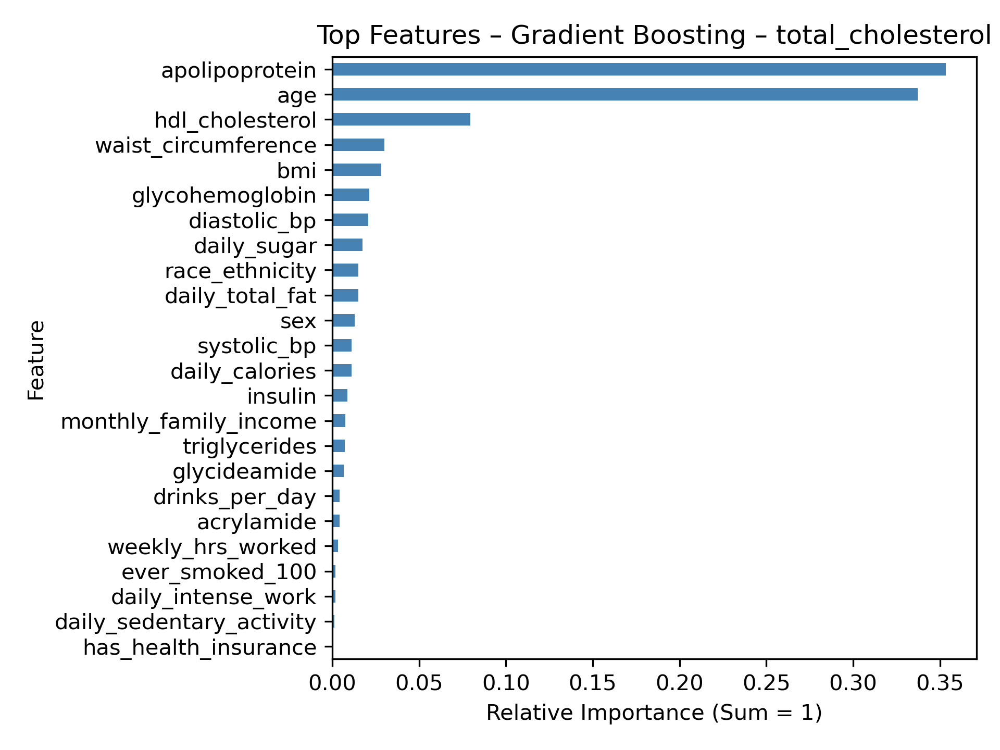

In [46]:
Image("files/figures_report/feature_importance/feature_importance_gradient_boosting_total_cholesterol.png")

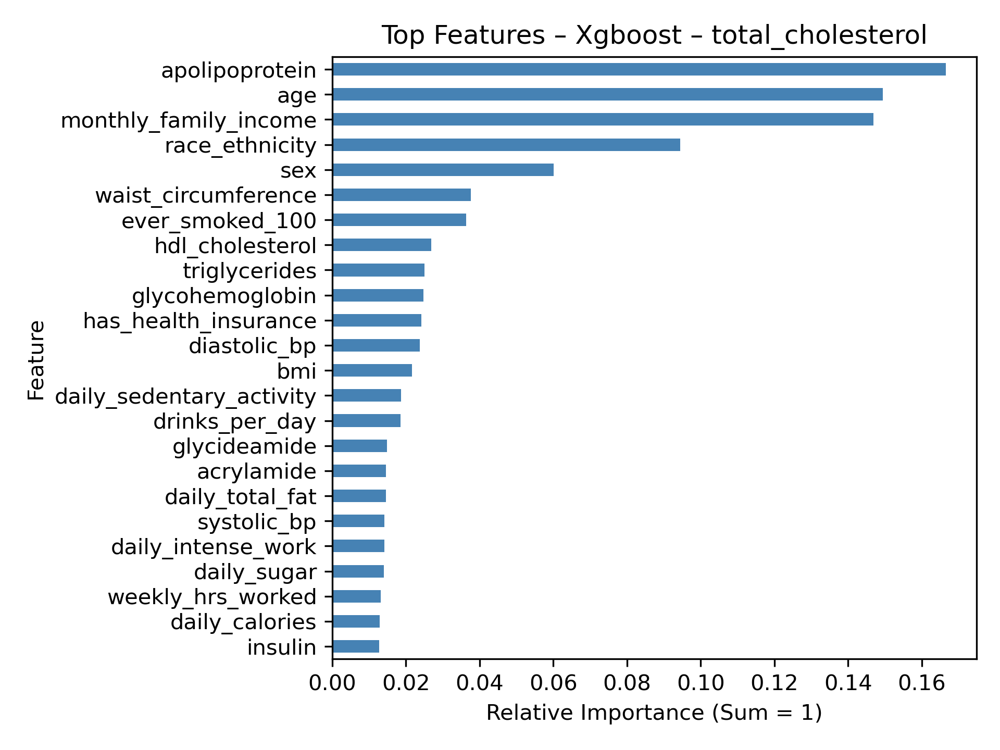

In [47]:
Image("files/figures_report/feature_importance/feature_importance_xgboost_total_cholesterol.png")

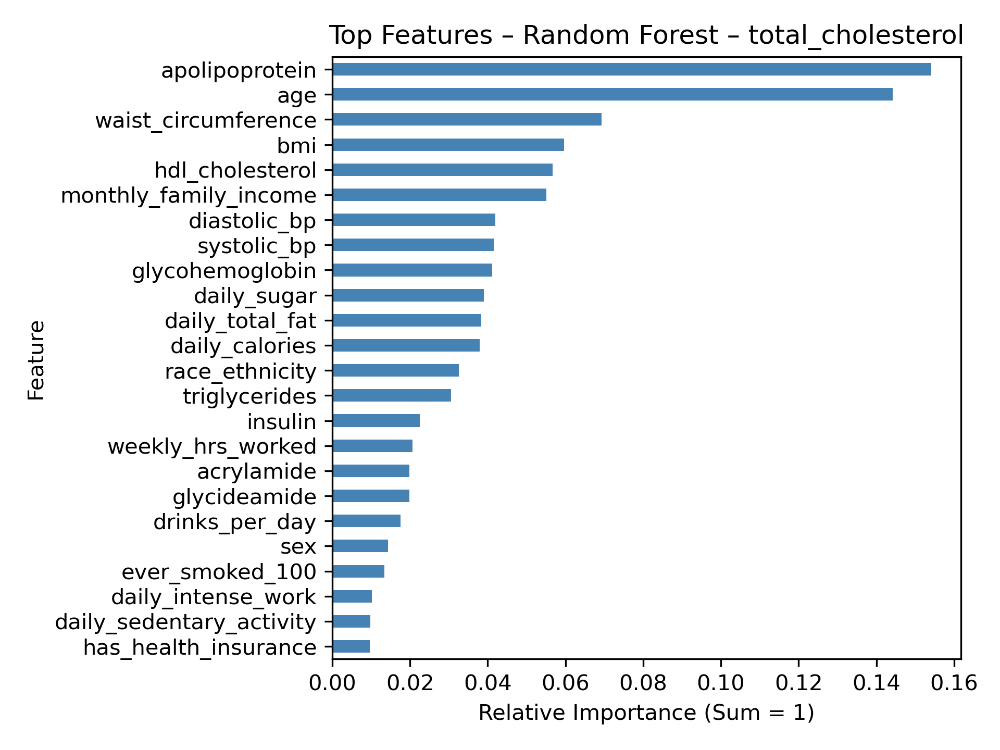

In [48]:
Image("files/figures_report/feature_importance/feature_importance_random_forest_total_cholesterol.png")

## 5. Residual Distributions – Prediction on New Data (2013–2014)

The figure below shows KDEs of residuals on a new dataset from NHANES 2013–2014, offering a final assessment of model generalization. Residuals represent the difference between predicted and true values of `total_cholesterol`. Each curve is normalized to unit area and plotted for each model.

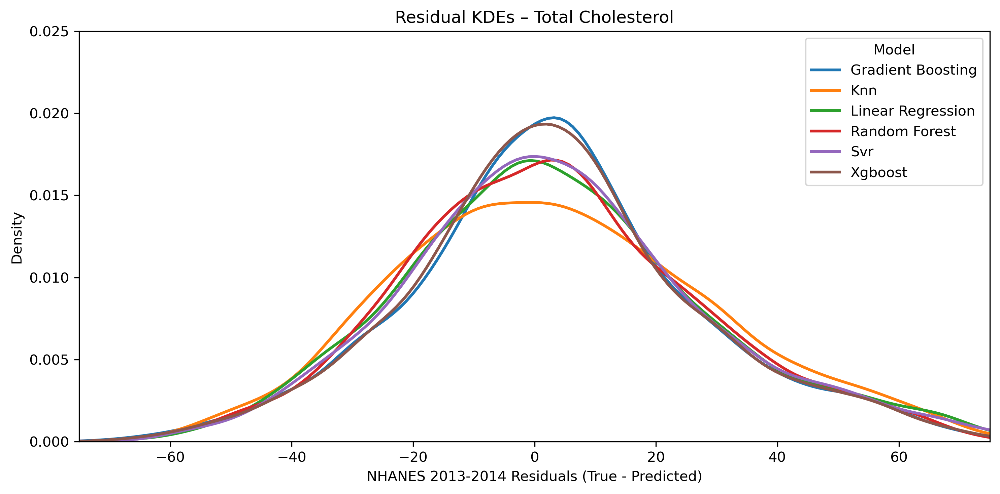

In [50]:
# Load data
df_pred_res = pd.read_csv("files/summaries_report/prediction_residuals_2013_2014.csv")

# Clean model names
df_pred_res["Model"] = df_pred_res["Model"].str.title()

# Settings
target_name = "total_cholesterol"
models = sorted(df_pred_res["Model"].unique())
palette = dict(zip(models, sns.color_palette(n_colors=len(models))))

# Plot
fig, ax1 = plt.subplots(figsize=(10, 5), dpi=300)

for model in models:
    resid_pred = df_pred_res.query("Model == @model and Target == @target_name")["Residual"]
    sns.kdeplot(resid_pred, ax=ax1, color=palette[model], linestyle="-", linewidth=2, label=model)

# Styling
ax1.set_xlim(-75, 75)
ax1.set_ylim(0, 0.025)
ax1.set_xlabel("NHANES 2013-2014 Residuals (True - Predicted)")
ax1.set_ylabel("Density")
ax1.set_title(f"Residual KDEs – {target_name.replace('_', ' ').title()}")
ax1.legend(title="Model")

plt.tight_layout()
plt.show()


Key observations (figure above):

- **KNN** exhibits a noticeably flatter and wider residual distribution, indicating higher error variance and reduced generalization performance compared to the other models.
- **Gradient Boosting**, and **XGBoost** display tightly centered, symmetric residual curves, consistent with strong generalization to new data.
- **Linear Regression**, **Random Forest**, and **SVR** produce wider, less peaked distributions, reflecting lower predictive capacity but relatively stable performance.

Overall, this plot reinforces the conclusion that tree-based ensemble methods generalize best across NHANES cycles for this task, with **XGBoost** and **Gradient Boosting** offering the most well-behaved error profiles of the model ensemble.

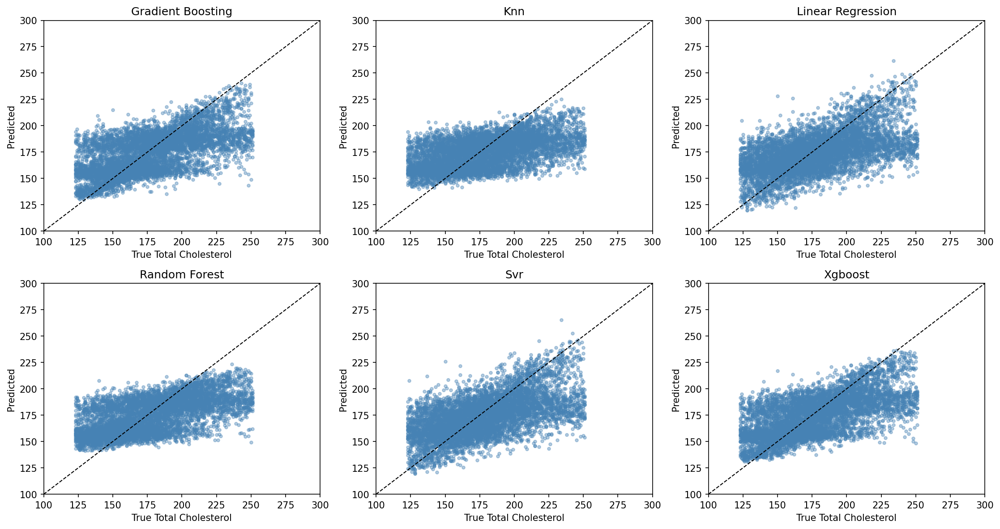

In [52]:
# === Load data ===
df_pred_res = pd.read_csv("files/summaries_report/prediction_residuals_2013_2014.csv")

# === Clean model names and compute predicted values ===
df_pred_res["Model"] = df_pred_res["Model"].str.title()
df_pred_res["Predicted"] = df_pred_res["True"] - df_pred_res["Residual"]

# === Setup for plotting ===
models = sorted(df_pred_res["Model"].unique())
n_models = len(models)
n_cols = 3
n_rows = (n_models + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows), dpi=150)
axes = axes.flatten()

# === Plot each model ===
for i, model in enumerate(models):
    ax = axes[i]
    model_data = df_pred_res[df_pred_res["Model"] == model]
    
    ax.scatter(model_data["True"], model_data["Predicted"], alpha=0.4, s=10, color="steelblue")
    ax.plot([100, 300], [100, 300], "k--", lw=1)  # 1:1 line

    ax.set_title(model)
    ax.set_xlabel("True Total Cholesterol")
    ax.set_ylabel("Predicted")
    ax.set_xlim(100, 300)
    ax.set_ylim(100, 300)

# === Hide any unused subplots ===
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


The figure above shows predicted vs. true values for each model on the **2013–2014 NHANES data**, which was not used during the previous training (including cross-validation) or testing. Each subplot includes a 1:1 reference line, where perfect predictions would lie.

These plots assess **calibration**, **bias**, and **generalization**:

- Most models show moderate alignment with the identity line, though all exhibit underprediction at higher cholesterol values and overprediction at lower cholesterol values.
- **Random Forest**, **Gradient Boosting**, and **XGBoost** produce tighter prediction clouds, reflecting stronger generalization.
- **KNN** and **Random Forest** display a comparatively sharp banding patterns, characteristic of instance-based methods and high capacity (ability to learn small-scale features in the data) models. This is likely a result of overfitting on the training data.
- **Linear Regression** and **SVR** appear more diffuse, suggesting limited capacity to capture nonlinear patterns in the data.

This comparison helps assess **how well each model generalizes to unseen samples** from a newer NHANES cycle and supports the selection of a final deployed model.

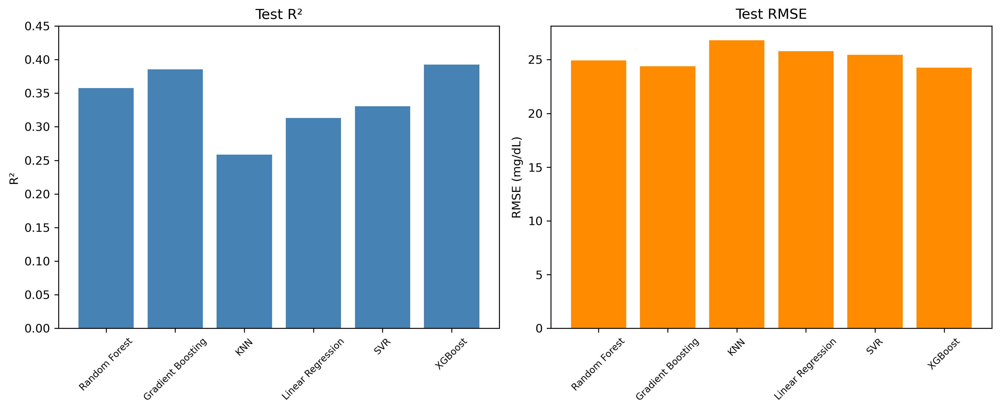

In [54]:
# Load the data
df_pred_met = pd.read_csv("files/summaries_report/prediction_metrics_2013_2014.csv")

# Extract values
model_names = df_pred_met["Model"]
r2_values = df_pred_met["R2 - total_cholesterol"]
rmse_values = df_pred_met["RMSE - total_cholesterol"]

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

# R² subplot
axes[0].bar(model_names, r2_values, color='steelblue')
axes[0].set_title("Test R²")
axes[0].set_ylabel("R²")
axes[0].set_ylim(0, 0.45)

# RMSE subplot
axes[1].bar(model_names, rmse_values, color='darkorange')
axes[1].set_title("Test RMSE")
axes[1].set_ylabel("RMSE (mg/dL)")

# Shared formatting
for ax in axes:
    ax.tick_params(axis='x', labelrotation=45, labelsize=8)

plt.tight_layout()
plt.show()


The bar plots above summarize each model’s performance for predicting `total_cholesterol`, using **R²** (left) and **RMSE** (right) as evaluation metrics.

- **XGBoost** achieved the best overall test performance, combining the **highest R²** with the **lowest RMSE**.
- **Gradient Boosting** and **Random Forest** followed closely, suggesting that ensemble-based models generalize well to new data.
- **KNN** performed the worst, showing signs of overfitting and weak generalization.
- **Linear Regression** and **SVR** yielded more stable, though modest, predictive accuracy.

These results reinforce the value of flexible, regularized ensemble models like XGBoost in structured prediction tasks.

## 5. **Conclusions and Future Improvements**

This case study demonstrates a flexible modeling pipeline for predicting `total_cholesterol` using NHANES data. Across multiple supervised regressors, I evaluated performance using robust cross-validation, tested generalization on held-out data (2015–2016), and further validated the best models on an external dataset (2013–2014).

### Key Findings

- **Gradient Boosting** and **XGBoost** consistently offered strong predictive performance, with the highest test R² 
values and relatively tight residual distributions, making them the top-performing models.
- Simpler models like **Linear Regression** and **SVR** were more stable but showed lower accuracy, especially at the extremes of the cholesterol distribution.
- **KNN** exhibited near-perfect training performance but failed to generalize, highlighting the risk of overfitting in non-parametric methods.
- Feature importance analyses across tree-based models consistently emphasized **apolipoprotein**, **age**, **income**, and **waist circumference** as key drivers of cholesterol levels.

### Limitations and Areas for Improvement

- **Model interpretability** could be improved using SHAP values or partial dependence plots to provide clearer clinical insights.
- While some models tend to **underpredict at higher cholesterol levels**, the variance of residuals appears relatively uniform across the range of true values. This suggests limited evidence of heteroscedasticity. However, further analysis could explore whether models like **quantile regression** or **heteroscedastic regressors** might better capture conditional uncertainty.
- **Temporal generalization** was only tested across two NHANES cycles; additional cycles could strengthen confidence in real-world performance.
- **Data augmentation** or domain adaptation techniques may improve performance when applying models across cycles with differing feature distributions.

### Future Extensions

- Explore the pipeline’s existing multi-target prediction capability (e.g., simultaneously predicting cholesterol, triglycerides, and glucose) in future examples and reports.
- Integrate **longitudinal data** or track repeated participants to explore temporal dynamics.
- Incorporate **causal modeling** to distinguish correlation from modifiable drivers.

This pipeline serves as a generalizable template for health biomarker modeling and can be extended or customized for other endpoints, populations, or health systems.
